## Setup

In [1]:
using DrWatson
@quickactivate "Doran_etal_2022"
using Muon
using Distances
using StatsPlots
using NewickTreeTools
using Phylo
using SPI
using MAT
using Statistics
using UMAP
using DataFrames
using CSV

In [2]:
pdir = plotsdir("uniformis_gnavus_umaps_and_extra")
mkpath(pdir)

"/Users/ben/projects/Doran_etal_2022/plots/uniformis_gnavus_umaps_and_extra"

In [3]:
biobank = readh5mu(joinpath(datadir(), "exp_pro", "BB673", "BB673.h5mu"))
uniprot = readh5ad(joinpath(datadir(), "exp_pro", "UP7047", "2020_02_UP7047.h5ad"));

In [4]:
# Match BioBank measurements to column order of UniProt
bbmtx = zeros(size(biobank["oggs"].X, 1), length(uniprot.var_names.vals));
rawidxs = indexin(biobank["oggs"].var_names.vals, uniprot.var_names.vals)
bbmask = .!isnothing.(rawidxs)
uporderedmask = filter(x->.!isnothing(x), rawidxs);
bbmtx[:, uporderedmask] .= biobank["oggs"].X[:, :][:, bbmask];

In [5]:
UPusv = SVD(uniprot.obsm["LSVs"][:, :], uniprot.uns["SVs"][:], uniprot.varm["RSVs"][:, :]');

In [6]:
BBuhat = projectinLSV(bbmtx, UPusv);

## Make M' and M'' and calculate variable OGGs

In [7]:
Mprime_spe = BBuhat[:, 1:90] * diagm(UPusv.S[1:90]) * UPusv.Vt[1:90, :];
Mprime_don = BBuhat[:, 91:end] * diagm(UPusv.S[91:end]) * UPusv.Vt[91:end, :];

In [8]:
arespeciesvariable = replace(mapslices(var, Mprime_spe, dims=1)[:] .> 1, true=>"is variable", false=>"is not variable");
aredonor_variable = replace(mapslices(var, Mprime_don, dims=1)[:] .> 1, true=>"is variable", false=>"is not variable");

In [9]:
whichspeciesOGGsarevariable = findall(mapslices(var, Mprime_spe, dims=1)[:] .> 1)
whichdonorOGGsarevariable = findall(mapslices(var, Mprime_don, dims=1)[:] .> 1);

In [10]:
setdiff(whichspeciesOGGsarevariable, whichdonorOGGsarevariable)|>length,
intersect(whichspeciesOGGsarevariable, whichdonorOGGsarevariable)|>length,
setdiff(whichdonorOGGsarevariable, whichspeciesOGGsarevariable)|>length

(129, 296, 177)

In [11]:
129 / 177

0.7288135593220338

## Small heatmap of variable OGGs

In [12]:
markedspeciesvariableoggs = ["COG0836", "COG1043", "COG0448", "COG3933"];
markeddonorvariableoggs = [
    "COG5314", "COG1978",
    "COG4734", "COG2946",
    "2Z8HY", "2Z7X2",
    "COG1256", "COG1397",
    "COG0472", "COG2369",
    "COG5412", "COG5433",
    "COG0467"
];


In [13]:
uniprot.var[indexin(markedspeciesvariableoggs, uniprot.var_names), :]

,og,level,nm,description
,String,Int64,Int64,String
1,COG0836,2,3382,mannose-1-phosphate guanylyltransferase activity
2,COG1043,2,2738,"involved in the biosynthesis of lipid A, a phosphorylated glycolipid that anchors the lipopolysaccharide to the outer membrane of the cell"
3,COG0448,2,4109,glucose-1-phosphate adenylyltransferase activity
4,COG3933,2,692,PFAM sigma-54 factor interaction domain-containing protein


In [14]:
r_idxs = occursin.("gnavus", biobank.obs.species) |> findall
popat!(r_idxs, occursin.("MSK.8.22", biobank.obs_names[r_idxs]) |> findfirst)
b_idxs = occursin.("uniformis", biobank.obs.species) |> findall;
# popat!(b_vulgatus_idxs, occursin.("MSK.7.24", biobank.obs_names[b_vulgatus_idxs]) |> findfirst)
donorid = biobank.obs_names |>
    v -> split.(v, ".") |>
    v -> getindex.(v, 2) |>
    v -> parse.(Int,v)

b_idxs = b_idxs[sortperm(donorid[b_idxs])]
r_idxs = r_idxs[sortperm(donorid[r_idxs])]

idxs = union(b_idxs,  r_idxs);

In [15]:
27 / 2

13.5

In [16]:
@show length(b_idxs), length(r_idxs)

(length(b_idxs), length(r_idxs)) = (27, 40)


(27, 40)

In [17]:
vidxs = something.(vcat(
          indexin(markedspeciesvariableoggs, biobank.var_names),
          indexin(markeddonorvariableoggs, biobank.var_names),
));

In [18]:
small_br_mtx = biobank["oggs"].X[idxs, vidxs];

In [20]:
oggisinbr = sum(bbmtx[idxs,:]; dims=1)[:] .> 0.;

In [702]:
Mprime_early_br = BBuhat[idxs, 1:10] * diagm(UPusv.S[1:10]) * UPusv.Vt[1:10, oggisinbr];
Mprime_middle_br = BBuhat[idxs, 11:90] * diagm(UPusv.S[11:90]) * UPusv.Vt[11:90, oggisinbr];
Mprime_late_br = BBuhat[idxs, 91:end] * diagm(UPusv.S[91:end]) * UPusv.Vt[91:end, oggisinbr];


In [1140]:
var_Mprime_early_br = mapslices(var, Mprime_early_br, dims=1)[:];
top10var_Mprime_early_oggs = partialsortperm(var_Mprime_early_br, 1:10; rev=true);
var_Mprime_middle_br = mapslices(var, Mprime_middle_br, dims=1)[:];
top10var_Mprime_middle_oggs = partialsortperm(var_Mprime_middle_br, 1:10; rev=true);
var_Mprime_late_br = mapslices(var, Mprime_late_br, dims=1)[:];
top10var_Mprime_late_oggs = partialsortperm(var_Mprime_late_br, 1:10; rev=true);

In [704]:
# the top 10 most variable in each window are orthogonal
intersect(top10var_Mprime_early_oggs, top10var_Mprime_middle_oggs, top10var_Mprime_late_oggs)

Int64[]

In [734]:
length(unique(pltdf.donor))

14

In [735]:
Matrix(biobank.obs[idxs, [:donor, :species]][hc.order, :])

67×2 Matrix{String}:
 "20"  "Bacteroides uniformis"
 "20"  "Bacteroides uniformis"
 "20"  "Bacteroides uniformis"
 "3"   "Bacteroides uniformis"
 "18"  "Bacteroides uniformis"
 "18"  "Bacteroides uniformis"
 "18"  "Bacteroides uniformis"
 "18"  "Bacteroides uniformis"
 "18"  "Bacteroides uniformis"
 "18"  "Bacteroides uniformis"
 ⋮     
 "23"  "[Ruminococcus] gnavus"
 "23"  "[Ruminococcus] gnavus"
 "23"  "[Ruminococcus] gnavus"
 "23"  "[Ruminococcus] gnavus"
 "23"  "[Ruminococcus] gnavus"
 "23"  "[Ruminococcus] gnavus"
 "23"  "[Ruminococcus] gnavus"
 "22"  "[Ruminococcus] gnavus"
 "23"  "[Ruminococcus] gnavus"

In [743]:
speciesdonorcmap = merge(
    Dict(k=>v for (k, v) in zip(["Bacteroides uniformis", "[Ruminococcus] gnavus"], palette(:glasbey_hv_n256).colors.colors[[5,6]])),
    Dict(k=>v for (k, v) in zip(unique(pltdf.donor), palette(:glasbey_bw_n256, length(unique(pltdf.donor))).colors.colors)),
);

In [767]:
palette(:glasbey_hv_n256).colors.colors[[3,1]]

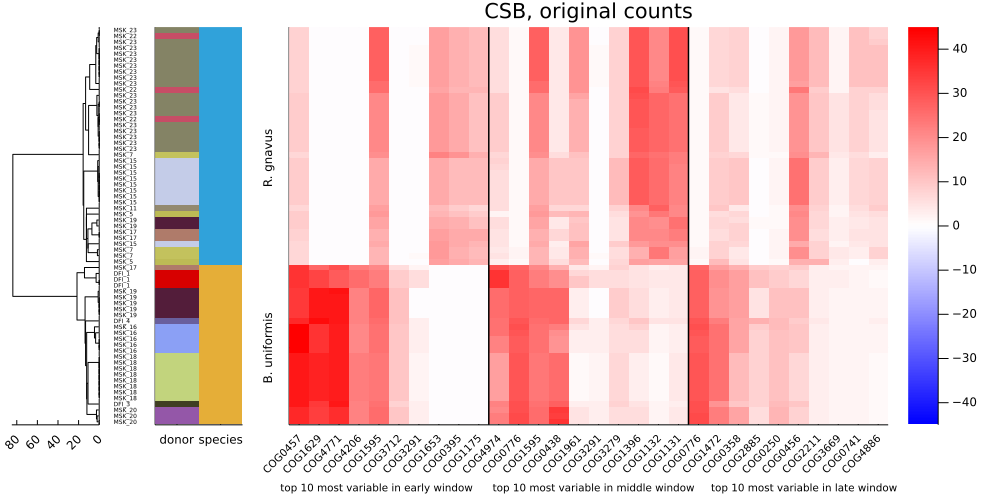

In [793]:
small_br_mtx_early = bbmtx[idxs, oggisinbr][:, top10var_Mprime_early_oggs];
small_br_mtx_middle = bbmtx[idxs, oggisinbr][:, top10var_Mprime_middle_oggs];
small_br_mtx_late = bbmtx[idxs, oggisinbr][:, top10var_Mprime_late_oggs];
earlyOGGorder = sortperm(small_br_mtx_early[1, :], rev=true)
middleOGGorder = sortperm(small_br_mtx_middle[1, :], rev=true)
lateOGGorder = sortperm(small_br_mtx_late[1, :], rev=true)
small_br_mtx = hcat(
    small_br_mtx_early[:, earlyOGGorder],
    small_br_mtx_middle[:, middleOGGorder],
    small_br_mtx_late[:, lateOGGorder],
);
oggnames = vcat(
    uniprot.var.og[oggisinbr][top10var_Mprime_early_oggs[earlyOGGorder]],
    uniprot.var.og[oggisinbr][top10var_Mprime_middle_oggs[middleOGGorder]],
    uniprot.var.og[oggisinbr][top10var_Mprime_late_oggs[lateOGGorder]]
);

hc = hclust(pairwise(Euclidean(), small_br_mtx'), linkage=:single, branchorder=:optimal) 
p1 = plot(hc, 
    xlims=(0, maximum(hc.heights) + 1),
    size=(200, 500),
    orientation=:horizontal,
    grid=false, 
    xflip=true, ymirror=true, 
    ytickfontsize=4,
    rightmargin=1Plots.Measures.mm,
    yticks=(1:length(hc.order), donorid[idxs][hc.order]),
    xrotation=45,
);

pltdf = biobank.obs[idxs, [:donor, :species]]
speciesdonorcmap = merge(
    Dict(k=>v for (k, v) in zip(["Bacteroides uniformis", "[Ruminococcus] gnavus"], palette(:glasbey_hv_n256).colors.colors[[3,1]])),
    Dict(k=>v for (k, v) in zip(sort(unique(pltdf.donor)), palette(:glasbey_bw_n256, length(unique(pltdf.donor))).colors.colors)),
);
speciesdonorcolormap(value) = speciesdonorcmap[value]
pltmtx = speciesdonorcolormap.(Matrix(biobank.obs[idxs, [:donor, :species]][hc.order, :]))
plot(size=(200, 500), xticks=(1:2, ["donor", "species"]), 
    yticks=:none, 
    colorbar=false, 
    leftmargin=0Plots.Measures.mm,
    rightmargin=0Plots.Measures.mm,
)
p2 = plot!(pltmtx, yflip=false, ratio=:none)

clms = extrema(small_br_mtx) |> 
    x -> maximum(abs.(x)) |>
    x -> (-x, x)
plot(title="CSB, original counts",
    yticks=([13.5, 45.5], ["B. uniformis", "R. gnavus"]),
    yrotation=90,
    xticks=(1:30, oggnames),
    xrotation=45,
    xtickfontsize=7,
    xlabel="top 10 most variable in early window      top 10 most variable in middle window     top 10 most variable in late window",
    xlabelfontsize=7,
    margin=1Plots.Measures.mm,
    bottommargin=7Plots.Measures.mm,
    )
heatmap!(small_br_mtx[hc.order, :], c=:bwr, clims=clms, label="")
p3 = vline!([10.5, 20.5], ls=:solid, c=:black, lw=1.5, label="");
lt = @layout [a{.1w} b{.1w} c{.8w}]
plot(p1, p2, p3, layout=lt, ymatch=true, size=(1000, 500))

In [795]:
savefig(joinpath(pdir, "originalcounts_hclust-origcnts-heatmap-top10oggheatmap_cm=bwr.pdf"))

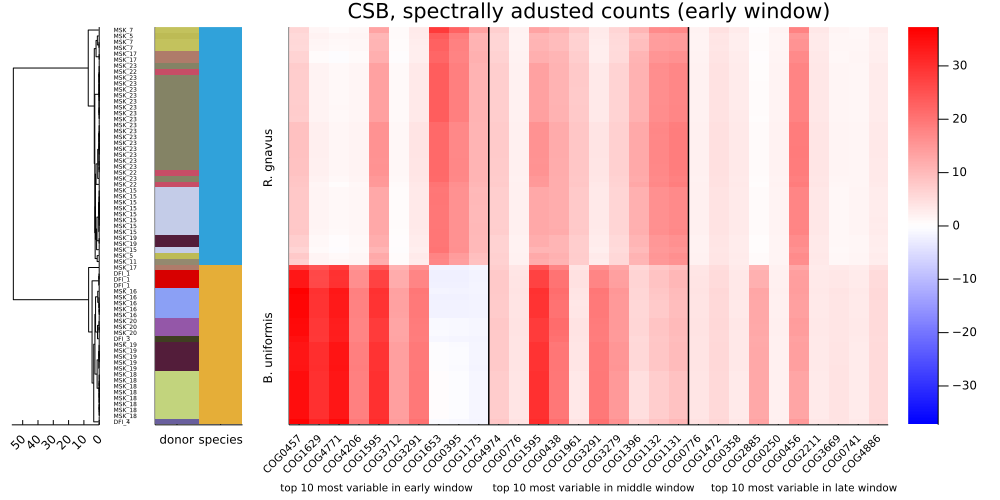

In [776]:
small_br_mtx_early = Mprime_early_br[:, top10var_Mprime_early_oggs];
small_br_mtx_middle = Mprime_early_br[:, top10var_Mprime_middle_oggs];
small_br_mtx_late = Mprime_early_br[:, top10var_Mprime_late_oggs];
# earlyOGGorder = sortperm(small_br_mtx_early[1, :], rev=true)
# middleOGGorder = sortperm(small_br_mtx_middle[1, :], rev=true)
# lateOGGorder = sortperm(small_br_mtx_late[1, :], rev=true)
small_br_mtx = hcat(
    small_br_mtx_early[:, earlyOGGorder],
    small_br_mtx_middle[:, middleOGGorder],
    small_br_mtx_late[:, lateOGGorder],
);
oggnames = vcat(
    uniprot.var.og[oggisinbr][top10var_Mprime_early_oggs[earlyOGGorder]],
    uniprot.var.og[oggisinbr][top10var_Mprime_middle_oggs[middleOGGorder]],
    uniprot.var.og[oggisinbr][top10var_Mprime_late_oggs[lateOGGorder]]
);

hc = hclust(pairwise(Euclidean(), small_br_mtx_early'), linkage=:single, branchorder=:optimal) 
p1 = plot(hc,
    xlims=(0,maximum(hc.heights) + 1),
    size=(200, 500),
    orientation=:horizontal,
    grid=false, 
    xflip=true, ymirror=true, 
    ytickfontsize=4,
    rightmargin=1Plots.Measures.mm,
    yticks=(1:length(hc.order), donorid[idxs][hc.order]),
    xrotation=45,
);

pltdf = biobank.obs[idxs, [:donor, :species]]
speciesdonorcmap = merge(
    Dict(k=>v for (k, v) in zip(["Bacteroides uniformis", "[Ruminococcus] gnavus"], palette(:glasbey_hv_n256).colors.colors[[3,1]])),
    Dict(k=>v for (k, v) in zip(sort(unique(pltdf.donor)), palette(:glasbey_bw_n256, length(unique(pltdf.donor))).colors.colors)),
);
speciesdonorcolormap(value) = speciesdonorcmap[value]
pltmtx = speciesdonorcolormap.(Matrix(biobank.obs[idxs, [:donor, :species]][hc.order, :]))
plot(size=(200, 500), xticks=(1:2, ["donor", "species"]), 
    yticks=:none, 
    colorbar=false, 
    leftmargin=0Plots.Measures.mm,
    rightmargin=0Plots.Measures.mm,
)
p2 = plot!(pltmtx, yflip=false, ratio=:none)

clms = extrema(small_br_mtx) |> 
    x -> maximum(abs.(x)) |>
    x -> (-x, x)
plot(title="CSB, spectrally adusted counts (early window)",
    yticks=([13.5, 45.5], ["B. uniformis", "R. gnavus"]),
    yrotation=90,
    xticks=(1:30, oggnames),
    xrotation=45,
    xtickfontsize=7,
    xlabel="top 10 most variable in early window      top 10 most variable in middle window     top 10 most variable in late window",
    xlabelfontsize=7,
    margin=1Plots.Measures.mm,
    bottommargin=7Plots.Measures.mm,
    )
heatmap!(small_br_mtx[hc.order, :], c=:bwr, clims=clms, label="")
p3 = vline!([10.5, 20.5], ls=:solid, c=:black, lw=1.5, label="");
lt = @layout [a{.1w} b{.1w} c{.8w}]
plot(p1, p2, p3, layout=lt, ymatch=true, size=(1000, 500))

In [777]:
# savefig
savefig(joinpath(pdir, "earlywindow_hclust-spadjcnts-heatmap-top10oggheatmap_cm=bwr.pdf"))

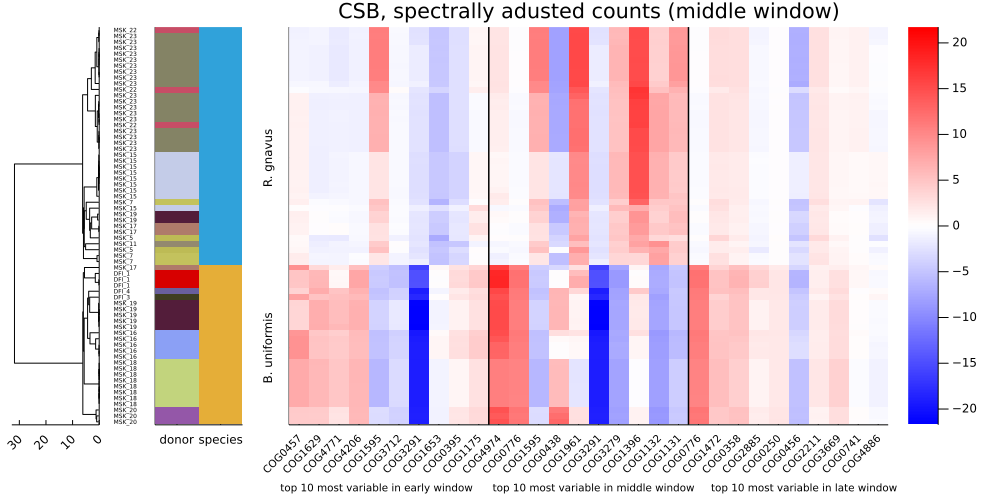

In [778]:
small_br_mtx_early = Mprime_middle_br[:, top10var_Mprime_early_oggs];
small_br_mtx_middle = Mprime_middle_br[:, top10var_Mprime_middle_oggs];
small_br_mtx_late = Mprime_middle_br[:, top10var_Mprime_late_oggs];
# earlyOGGorder = sortperm(small_br_mtx_early[1, :], rev=true)
# middleOGGorder = sortperm(small_br_mtx_middle[1, :], rev=true)
# lateOGGorder = sortperm(small_br_mtx_late[1, :], rev=true)
small_br_mtx = hcat(
    small_br_mtx_early[:, earlyOGGorder],
    small_br_mtx_middle[:, middleOGGorder],
    small_br_mtx_late[:, lateOGGorder],
);
oggnames = vcat(
    uniprot.var.og[oggisinbr][top10var_Mprime_early_oggs[earlyOGGorder]],
    uniprot.var.og[oggisinbr][top10var_Mprime_middle_oggs[middleOGGorder]],
    uniprot.var.og[oggisinbr][top10var_Mprime_late_oggs[lateOGGorder]]
);

hc = hclust(pairwise(Euclidean(), small_br_mtx_middle'), linkage=:single, branchorder=:optimal) 
p1 = plot(hc,
    xlims=(0, maximum(hc.heights) + 1),
    size=(200, 500),
    orientation=:horizontal,
    grid=false, 
    xflip=true, ymirror=true, 
    ytickfontsize=4,
    rightmargin=1Plots.Measures.mm,
    yticks=(1:length(hc.order), donorid[idxs][hc.order]),
    xrotation=45,
);

pltdf = biobank.obs[idxs, [:donor, :species]]
speciesdonorcmap = merge(
    Dict(k=>v for (k, v) in zip(["Bacteroides uniformis", "[Ruminococcus] gnavus"], palette(:glasbey_hv_n256).colors.colors[[3,1]])),
    Dict(k=>v for (k, v) in zip(sort(unique(pltdf.donor)), palette(:glasbey_bw_n256, length(unique(pltdf.donor))).colors.colors)),
);
speciesdonorcolormap(value) = speciesdonorcmap[value]
pltmtx = speciesdonorcolormap.(Matrix(biobank.obs[idxs, [:donor, :species]][hc.order, :]))
plot(size=(200, 500), xticks=(1:2, ["donor", "species"]), 
    yticks=:none, 
    colorbar=false, 
    leftmargin=0Plots.Measures.mm,
    rightmargin=0Plots.Measures.mm,
)
p2 = plot!(pltmtx, yflip=false, ratio=:none)

clms = extrema(small_br_mtx) |> 
    x -> maximum(abs.(x)) |>
    x -> (-x, x)
plot(title="CSB, spectrally adusted counts (middle window)",
    yticks=([13.5, 45.5], ["B. uniformis", "R. gnavus"]),
    yrotation=90,
    xticks=(1:30, oggnames),
    xrotation=45,
    xtickfontsize=7,
    xlabel="top 10 most variable in early window      top 10 most variable in middle window     top 10 most variable in late window",
    xlabelfontsize=7,
    margin=1Plots.Measures.mm,
    bottommargin=7Plots.Measures.mm,
    )
heatmap!(small_br_mtx[hc.order, :], c=:bwr, clims=clms, label="")
p3 = vline!([10.5, 20.5], ls=:solid, c=:black, lw=1.5, label="");
lt = @layout [a{.1w} b{.1w} c{.8w}]
plot(p1, p2, p3, layout=lt, ymatch=true, size=(1000, 500))

In [779]:
# savefig
savefig(joinpath(pdir, "middlewindow_hclust-spadjcnts-heatmap-top10oggheatmap_cm=bwr.pdf"))

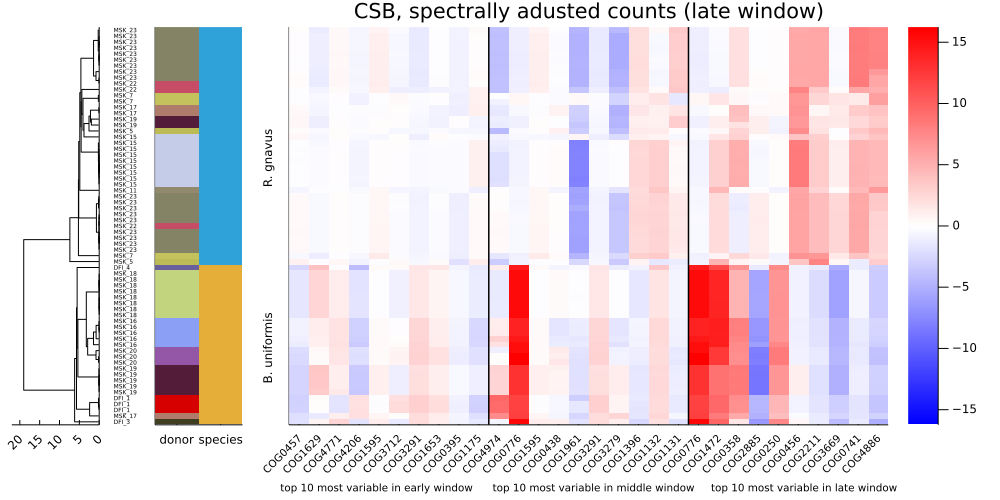

In [783]:
small_br_mtx_early = Mprime_late_br[:, top10var_Mprime_early_oggs];
small_br_mtx_middle = Mprime_late_br[:, top10var_Mprime_middle_oggs];
small_br_mtx_late = Mprime_late_br[:, top10var_Mprime_late_oggs];
# earlyOGGorder = sortperm(small_br_mtx_early[1, :], rev=true)
# middleOGGorder = sortperm(small_br_mtx_middle[1, :], rev=true)
# lateOGGorder = sortperm(small_br_mtx_late[1, :], rev=true)
small_br_mtx = hcat(
    small_br_mtx_early[:, earlyOGGorder],
    small_br_mtx_middle[:, middleOGGorder],
    small_br_mtx_late[:, lateOGGorder],
);
oggnames = vcat(
    uniprot.var.og[oggisinbr][top10var_Mprime_early_oggs[earlyOGGorder]],
    uniprot.var.og[oggisinbr][top10var_Mprime_middle_oggs[middleOGGorder]],
    uniprot.var.og[oggisinbr][top10var_Mprime_late_oggs[lateOGGorder]]
);

hc = hclust(pairwise(Euclidean(), small_br_mtx_late'), linkage=:single, branchorder=:optimal) 
p1 = plot(hc, 
    xlims=(0, maximum(hc.heights) + 3),
    size=(200, 500),
    orientation=:horizontal,
    grid=false, 
    xflip=true, ymirror=true, 
    ytickfontsize=4,
    rightmargin=1Plots.Measures.mm,
    yticks=(1:length(hc.order), donorid[idxs][hc.order]),
    xrotation=45,
);

pltdf = biobank.obs[idxs, [:donor, :species]]
speciesdonorcmap = merge(
    Dict(k=>v for (k, v) in zip(["Bacteroides uniformis", "[Ruminococcus] gnavus"], palette(:glasbey_hv_n256).colors.colors[[3,1]])),
    Dict(k=>v for (k, v) in zip(sort(unique(pltdf.donor)), palette(:glasbey_bw_n256, length(unique(pltdf.donor))).colors.colors)),
);
speciesdonorcolormap(value) = speciesdonorcmap[value]
pltmtx = speciesdonorcolormap.(Matrix(biobank.obs[idxs, [:donor, :species]][hc.order, :]))
plot(size=(200, 500), xticks=(1:2, ["donor", "species"]), 
    yticks=:none, 
    colorbar=false, 
    leftmargin=0Plots.Measures.mm,
    rightmargin=0Plots.Measures.mm,
)
p2 = plot!(pltmtx, yflip=false, ratio=:none)

clms = extrema(small_br_mtx) |> 
    x -> maximum(abs.(x)) |>
    x -> (-x, x)
plot(title="CSB, spectrally adusted counts (late window)",
    yticks=([13.5, 45.5], ["B. uniformis", "R. gnavus"]),
    yrotation=90,
    xticks=(1:30, oggnames),
    xrotation=45,
    xtickfontsize=7,
    xlabel="top 10 most variable in early window      top 10 most variable in middle window     top 10 most variable in late window",
    xlabelfontsize=7,
    margin=1Plots.Measures.mm,
    bottommargin=7Plots.Measures.mm,
    )
heatmap!(small_br_mtx[hc.order, :], c=:bwr, clims=clms, label="")
p3 = vline!([10.5, 20.5], ls=:solid, c=:black, lw=1.5, label="");
lt = @layout [a{.1w} b{.1w} c{.8w}]
plot(p1, p2, p3, layout=lt, ymatch=true, size=(1000, 500))

In [781]:
savefig(joinpath(pdir, "latewindow_hclust-spadjcnts-heatmap-top10oggheatmap_cm=bwr.pdf"))

## Subset heatmap

In [1058]:
gr()

Plots.GRBackend()

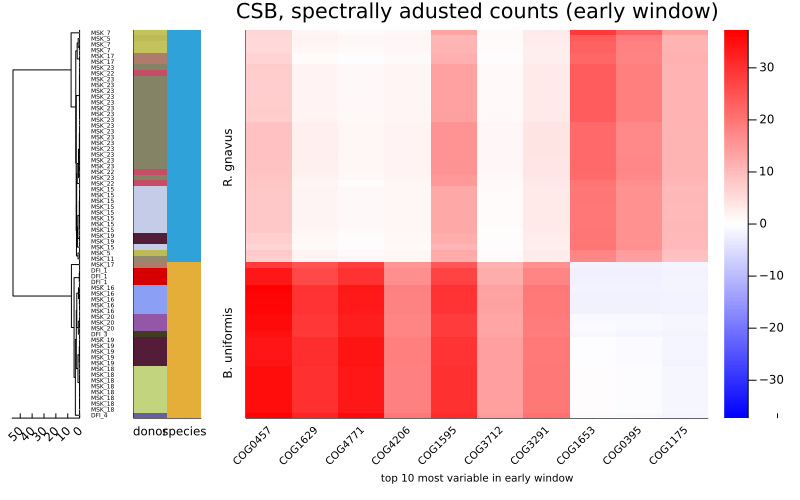

In [1060]:
small_br_mtx_early = Mprime_early_br[:, top10var_Mprime_early_oggs];
small_br_mtx_middle = Mprime_early_br[:, top10var_Mprime_middle_oggs];
small_br_mtx_late = Mprime_early_br[:, top10var_Mprime_late_oggs];
# earlyOGGorder = sortperm(small_br_mtx_early[1, :], rev=true)
# middleOGGorder = sortperm(small_br_mtx_middle[1, :], rev=true)
# lateOGGorder = sortperm(small_br_mtx_late[1, :], rev=true)
small_br_mtx = hcat(
    small_br_mtx_early[:, earlyOGGorder],
    # small_br_mtx_middle[:, middleOGGorder],
    # small_br_mtx_late[:, lateOGGorder],
);
oggnames = vcat(
    uniprot.var.og[oggisinbr][top10var_Mprime_early_oggs[earlyOGGorder]],
    # uniprot.var.og[oggisinbr][top10var_Mprime_middle_oggs[middleOGGorder]],
    # uniprot.var.og[oggisinbr][top10var_Mprime_late_oggs[lateOGGorder]]
);

hc = hclust(pairwise(Euclidean(), small_br_mtx_early'), linkage=:single, branchorder=:optimal) 
p1 = plot(hc,
    xlims=(0,maximum(hc.heights) + 1),
    size=(200, 500),
    orientation=:horizontal,
    grid=false, 
    xflip=true, ymirror=true, 
    ytickfontsize=4,
    rightmargin=1Plots.Measures.mm,
    yticks=(1:length(hc.order), donorid[idxs][hc.order]),
    xrotation=45,
);

pltdf = biobank.obs[idxs, [:donor, :species]]
speciesdonorcmap = merge(
    Dict(k=>v for (k, v) in zip(["Bacteroides uniformis", "[Ruminococcus] gnavus"], palette(:glasbey_hv_n256).colors.colors[[3,1]])),
    Dict(k=>v for (k, v) in zip(sort(unique(pltdf.donor)), palette(:glasbey_bw_n256, length(unique(pltdf.donor))).colors.colors)),
);
speciesdonorcolormap(value) = speciesdonorcmap[value]
pltmtx = speciesdonorcolormap.(Matrix(biobank.obs[idxs, [:donor, :species]][hc.order, :]))
plot(size=(200, 500), xticks=(1:2, ["donor", "species"]), 
    yticks=:none, 
    colorbar=false, 
    leftmargin=0Plots.Measures.mm,
    rightmargin=0Plots.Measures.mm,
)
p2 = plot!(pltmtx, yflip=false, ratio=:none)

clms = extrema(small_br_mtx) |> 
    x -> maximum(abs.(x)) |>
    x -> (-x, x)
plot(title="CSB, spectrally adusted counts (early window)",
    yticks=([13.5, 45.5], ["B. uniformis", "R. gnavus"]),
    yrotation=90,
    xticks=(1:30, oggnames),
    xrotation=45,
    xtickfontsize=7,
    xlabel="top 10 most variable in early window",
    xlabelfontsize=7,
    margin=1Plots.Measures.mm,
    bottommargin=7Plots.Measures.mm,
    )
p3 = heatmap!(small_br_mtx[hc.order, :], c=:bwr, clims=clms, label="")
# p3 = vline!([10.5, 20.5], ls=:solid, c=:black, lw=1.5, label="");
lt = @layout [a{.1w} b{.1w} c{.8w}]
plot(p1, p2, p3, layout=lt, ymatch=true, size=(800, 500))

In [1061]:
# savefig
savefig(joinpath(pdir, "earlywindow_hclust-spadjcnts-heatmap-top10oggheatmap_cm=bwr_subsetoggs.pdf"))

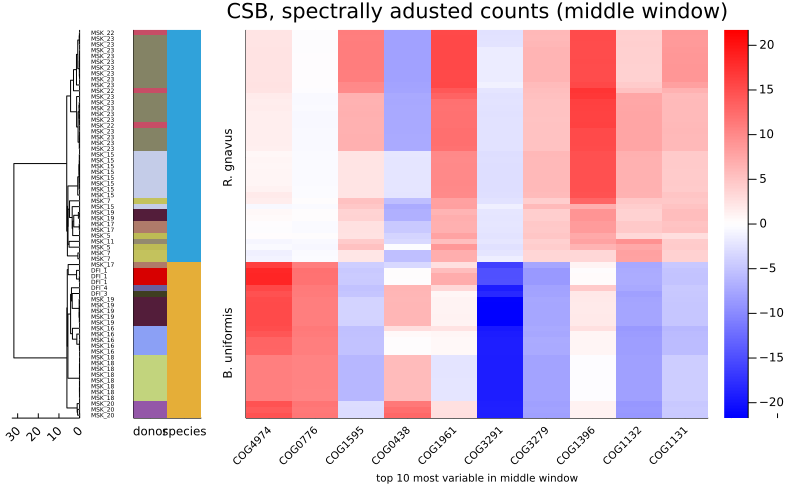

In [1063]:
small_br_mtx_early = Mprime_middle_br[:, top10var_Mprime_early_oggs];
small_br_mtx_middle = Mprime_middle_br[:, top10var_Mprime_middle_oggs];
small_br_mtx_late = Mprime_middle_br[:, top10var_Mprime_late_oggs];
# earlyOGGorder = sortperm(small_br_mtx_early[1, :], rev=true)
# middleOGGorder = sortperm(small_br_mtx_middle[1, :], rev=true)
# lateOGGorder = sortperm(small_br_mtx_late[1, :], rev=true)
small_br_mtx = hcat(
    # small_br_mtx_early[:, earlyOGGorder],
    small_br_mtx_middle[:, middleOGGorder],
    # small_br_mtx_late[:, lateOGGorder],
);
oggnames = vcat(
    # uniprot.var.og[oggisinbr][top10var_Mprime_early_oggs[earlyOGGorder]],
    uniprot.var.og[oggisinbr][top10var_Mprime_middle_oggs[middleOGGorder]],
    # uniprot.var.og[oggisinbr][top10var_Mprime_late_oggs[lateOGGorder]]
);

hc = hclust(pairwise(Euclidean(), small_br_mtx_middle'), linkage=:single, branchorder=:optimal) 
p1 = plot(hc,
    xlims=(0, maximum(hc.heights) + 1),
    size=(200, 500),
    orientation=:horizontal,
    grid=false, 
    xflip=true, ymirror=true, 
    ytickfontsize=4,
    rightmargin=1Plots.Measures.mm,
    yticks=(1:length(hc.order), donorid[idxs][hc.order]),
    xrotation=45,
);

pltdf = biobank.obs[idxs, [:donor, :species]]
speciesdonorcmap = merge(
    Dict(k=>v for (k, v) in zip(["Bacteroides uniformis", "[Ruminococcus] gnavus"], palette(:glasbey_hv_n256).colors.colors[[3,1]])),
    Dict(k=>v for (k, v) in zip(sort(unique(pltdf.donor)), palette(:glasbey_bw_n256, length(unique(pltdf.donor))).colors.colors)),
);
speciesdonorcolormap(value) = speciesdonorcmap[value]
pltmtx = speciesdonorcolormap.(Matrix(biobank.obs[idxs, [:donor, :species]][hc.order, :]))
plot(size=(200, 500), xticks=(1:2, ["donor", "species"]), 
    yticks=:none, 
    colorbar=false, 
    leftmargin=0Plots.Measures.mm,
    rightmargin=0Plots.Measures.mm,
)
p2 = plot!(pltmtx, yflip=false, ratio=:none)

clms = extrema(small_br_mtx) |> 
    x -> maximum(abs.(x)) |>
    x -> (-x, x)
plot(title="CSB, spectrally adusted counts (middle window)",
    yticks=([13.5, 45.5], ["B. uniformis", "R. gnavus"]),
    yrotation=90,
    xticks=(1:30, oggnames),
    xrotation=45,
    xtickfontsize=7,
    xlabel="top 10 most variable in middle window",
    xlabelfontsize=7,
    margin=1Plots.Measures.mm,
    bottommargin=7Plots.Measures.mm,
    )
p3 = heatmap!(small_br_mtx[hc.order, :], c=:bwr, clims=clms, label="")
# p3 = vline!([10.5, 20.5], ls=:solid, c=:black, lw=1.5, label="");
lt = @layout [a{.1w} b{.1w} c{.8w}]
plot(p1, p2, p3, layout=lt, ymatch=true, size=(800, 500))

In [1064]:
# savefig
savefig(joinpath(pdir, "middlewindow_hclust-spadjcnts-heatmap-top10oggheatmap_cm=bwr_subsetoggs.pdf"))

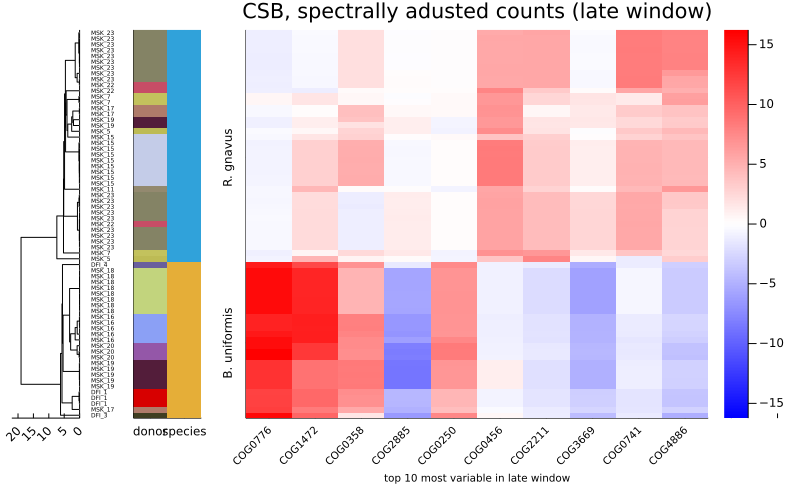

In [1065]:
small_br_mtx_early = Mprime_late_br[:, top10var_Mprime_early_oggs];
small_br_mtx_middle = Mprime_late_br[:, top10var_Mprime_middle_oggs];
small_br_mtx_late = Mprime_late_br[:, top10var_Mprime_late_oggs];
# earlyOGGorder = sortperm(small_br_mtx_early[1, :], rev=true)
# middleOGGorder = sortperm(small_br_mtx_middle[1, :], rev=true)
# lateOGGorder = sortperm(small_br_mtx_late[1, :], rev=true)
small_br_mtx = hcat(
    # small_br_mtx_early[:, earlyOGGorder],
    # small_br_mtx_middle[:, middleOGGorder],
    small_br_mtx_late[:, lateOGGorder],
);
oggnames = vcat(
    # uniprot.var.og[oggisinbr][top10var_Mprime_early_oggs[earlyOGGorder]],
    # uniprot.var.og[oggisinbr][top10var_Mprime_middle_oggs[middleOGGorder]],
    uniprot.var.og[oggisinbr][top10var_Mprime_late_oggs[lateOGGorder]]
);

hc = hclust(pairwise(Euclidean(), small_br_mtx_late'), linkage=:single, branchorder=:optimal) 
p1 = plot(hc, 
    xlims=(0, maximum(hc.heights) + 3),
    size=(200, 500),
    orientation=:horizontal,
    grid=false, 
    xflip=true, ymirror=true, 
    ytickfontsize=4,
    rightmargin=1Plots.Measures.mm,
    yticks=(1:length(hc.order), donorid[idxs][hc.order]),
    xrotation=45,
);

pltdf = biobank.obs[idxs, [:donor, :species]]
speciesdonorcmap = merge(
    Dict(k=>v for (k, v) in zip(["Bacteroides uniformis", "[Ruminococcus] gnavus"], palette(:glasbey_hv_n256).colors.colors[[3,1]])),
    Dict(k=>v for (k, v) in zip(sort(unique(pltdf.donor)), palette(:glasbey_bw_n256, length(unique(pltdf.donor))).colors.colors)),
);
speciesdonorcolormap(value) = speciesdonorcmap[value]
pltmtx = speciesdonorcolormap.(Matrix(biobank.obs[idxs, [:donor, :species]][hc.order, :]))
plot(size=(200, 500), xticks=(1:2, ["donor", "species"]), 
    yticks=:none, 
    colorbar=false, 
    leftmargin=0Plots.Measures.mm,
    rightmargin=0Plots.Measures.mm,
)
p2 = plot!(pltmtx, yflip=false, ratio=:none)

clms = extrema(small_br_mtx) |> 
    x -> maximum(abs.(x)) |>
    x -> (-x, x)
plot(title="CSB, spectrally adusted counts (late window)",
    yticks=([13.5, 45.5], ["B. uniformis", "R. gnavus"]),
    yrotation=90,
    xticks=(1:30, oggnames),
    xrotation=45,
    xtickfontsize=7,
    xlabel="top 10 most variable in late window",
    xlabelfontsize=7,
    margin=1Plots.Measures.mm,
    bottommargin=7Plots.Measures.mm,
    )
p3 = heatmap!(small_br_mtx[hc.order, :], c=:bwr, clims=clms, label="")
# p3 = vline!([10.5, 20.5], ls=:solid, c=:black, lw=1.5, label="");
lt = @layout [a{.1w} b{.1w} c{.8w}]
plot(p1, p2, p3, layout=lt, ymatch=true, size=(800, 500))

In [1066]:
savefig(joinpath(pdir, "latewindow_hclust-spadjcnts-heatmap-top10oggheatmap_cm=bwr_subsetoggs.pdf"))

In [1073]:
length(b_idxs)

27

In [1072]:
Mprime_early_br |> size

(67, 2583)

In [1074]:
earlyb = Mprime_early_br[1:27, top10var_Mprime_early_oggs];
earlyr = Mprime_early_br[28:end, top10var_Mprime_early_oggs];
middleb = Mprime_middle_br[1:17, top10var_Mprime_middle_oggs];
middler = Mprime_middle_br[28:end, top10var_Mprime_middle_oggs];
lateb = Mprime_late_br[1:27, top10var_Mprime_late_oggs];
later = Mprime_late_br[28:end, top10var_Mprime_late_oggs];

earlyoggnames = uniprot.var.og[oggisinbr][top10var_Mprime_early_oggs[earlyOGGorder]]
middleoggnames = uniprot.var.og[oggisinbr][top10var_Mprime_middle_oggs[middleOGGorder]]
lateoggnames = uniprot.var.og[oggisinbr][top10var_Mprime_late_oggs[lateOGGorder]];

In [1137]:
setdiff(top10var_Mprime_late_oggs, top10var_Mprime_early_oggs, top10var_Mprime_middle_oggs)

9-element Vector{Int64}:
 1038
 2095
  642
  391
 1540
  218
 1383
 1796
  315

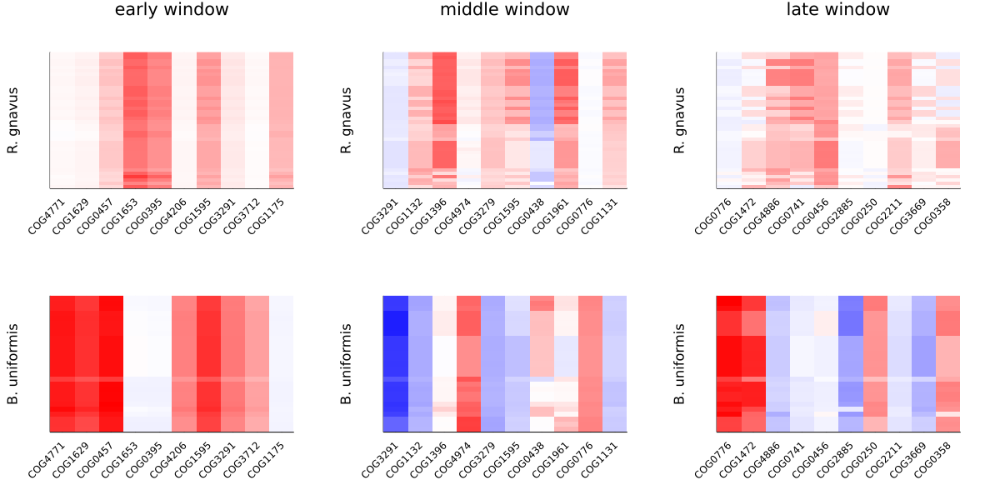

In [1128]:
plts = []
for (win, mprime, oggidx, oggnames) in zip(["early", "middle", "late"],
    [Mprime_early_br, Mprime_middle_br, Mprime_late_br],
    [top10var_Mprime_early_oggs, top10var_Mprime_middle_oggs, top10var_Mprime_late_oggs],
    [earlyoggnames, middleoggnames, lateoggnames],
    )
    mtxb = mprime[1:27, oggidx]
    mtxr = mprime[28:end, oggidx];
    oggnames = uniprot.var.og[oggisinbr][oggidx]
    clms = extrema(mprime) |> 
        x -> maximum(abs.(x)) |>
        x -> (-x, x)
    plot(ylabel="B. uniformis", yticks=false, xticks=(1:10, oggnames), xrotation=45, margin=2Plots.Measures.mm)
    p1 = heatmap!(mtxb, c=:bwr, clims=clms, label="", colorbar=false)
    plot(title="$win window", ylabel="R. gnavus", yticks=false, xticks=(1:10, oggnames), xrotation=45, margin=2Plots.Measures.mm)
    p2 = heatmap!(mtxr, c=:bwr, clims=clms, label="", colorbar=false)
    cb = scatter([-10], [-10], zcolor=[0], alpha=0., markersize=0., framestyle=:none,
         c=:bwr, clims=clms, margin=5Plots.Measures.mm, label="")
    lts= @layout [grid(2,1)]
    push!(plts, plot(p2,  p1,  layout=lts))
end
plot(plts..., layout=grid(1,3), size=(1200,600), margin=10Plots.Measures.mm)

In [1129]:
savefig(joinpath(pdir, "early-middle-late_splitheatmaps_nocolorbar.pdf"))

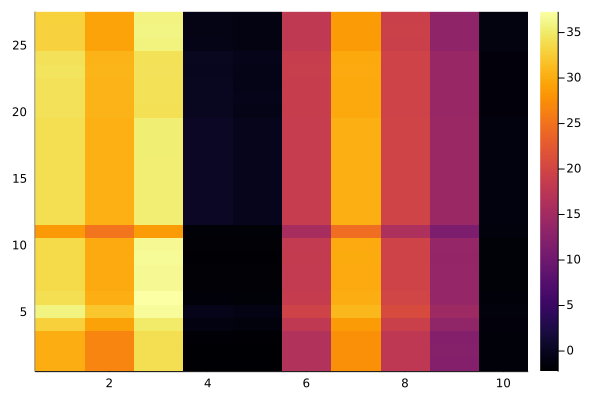

In [1075]:
clms = extrema(small_br_mtx) |> 
    x -> maximum(abs.(x)) |>
    x -> (-x, x)
plot(title="CSB, spectrally adusted counts (late window)",
    yticks=([13.5, 45.5], ["B. uniformis", "R. gnavus"]),
    yrotation=90,
    xticks=(1:30, oggnames),
    xrotation=45,
    xtickfontsize=7,
    xlabel="top 10 most variable in late window",
    xlabelfontsize=7,
    margin=1Plots.Measures.mm,
    bottommargin=7Plots.Measures.mm,
    )
p3 = heatmap!(small_br_mtx[hc.order, :], c=:bwr, clims=clms, label="")

In [1071]:
earlyoggnames = uniprot.var.og[oggisinbr][top10var_Mprime_early_oggs[earlyOGGorder]]
middleoggnames = uniprot.var.og[oggisinbr][top10var_Mprime_middle_oggs[middleOGGorder]]
lateoggnames = uniprot.var.og[oggisinbr][top10var_Mprime_late_oggs[lateOGGorder]];

In [787]:
uniprot.var[top10var_Mprime_early_oggs[earlyOGGorder], :]

,og,level,nm,description
,String,Int64,Int64,String
1,COG0396,2,3590,ATPase activity
2,COG1296,2,3503,L-valine transmembrane transporter activity
3,COG2606,2,5405,Cys-tRNA(Pro) hydrolase activity
4,COG2263,2,517,DNA repair
5,COG1287,2,1337,oligosaccharyl transferase activity
6,COG2134,2,254,cdp-diacylglycerol pyrophosphatase
7,COG1949,2,1714,3'-to-5' exoribonuclease specific for small oligoribonucleotides
8,COG1313,2,491,radical SAM domain protein
9,COG0353,2,4384,DNA recombination


In [788]:
uniprot.var[top10var_Mprime_middle_oggs[middleOGGorder], :]

,og,level,nm,description
,String,Int64,Int64,String
1,COG2827,2,3193,Endonuclease containing a URI domain
2,COG0679,2,5778,auxin-activated signaling pathway
3,COG1287,2,1337,oligosaccharyl transferase activity
4,COG0391,2,2680,"phosphotransferase activity, for other substituted phosphate groups"
5,COG1468,2,1311,"DNA catabolic process, exonucleolytic"
6,COG1949,2,1714,3'-to-5' exoribonuclease specific for small oligoribonucleotides
7,COG1945,2,171,arginine decarboxylase activity
8,COG1171,2,7057,"Catalyzes the anaerobic formation of alpha-ketobutyrate and ammonia from threonine in a two-step reaction. The first step involved a dehydration of threonine and a production of enamine intermediates (aminocrotonate), which tautomerizes to its imine form (iminobutyrate). Both intermediates are unstable and short- lived. The second step is the nonenzymatic hydrolysis of the enamine imine intermediates to form 2-ketobutyrate and free ammonia. In the low water environment of the cell, the second step is accelerated by RidA"
9,COG0829,2,1676,nickel cation binding


In [789]:
uniprot.var[top10var_Mprime_late_oggs[lateOGGorder], :]

,og,level,nm,description
,String,Int64,Int64,String
1,COG0679,2,5778,auxin-activated signaling pathway
2,COG1208,2,5814,"COG1208 Nucleoside-diphosphate-sugar pyrophosphorylase involved in lipopolysaccharide biosynthesis translation initiation factor 2B, gamma epsilon subunits eIF-2Bgamma eIF-2Bepsilon"
3,COG0317,2,7528,In eubacteria ppGpp (guanosine 3'-diphosphate 5-' diphosphate) is a mediator of the stringent response that coordinates a variety of cellular activities in response to changes in nutritional abundance
4,COG1788,2,3876,CoA-transferase activity
5,COG0219,2,3349,wobble position uridine ribose methylation
6,COG0392,2,5253,lysyltransferase activity
7,COG1593,2,7124,mannitol 2-dehydrogenase activity
8,COG2110,2,3083,phosphatase homologous to the C-terminal domain of histone macroH2A1
9,COG0648,2,2180,deoxyribonuclease IV (phage-T4-induced) activity


In [1135]:
uniprot.var[oggisinbr, :][top10var_Mprime_late_oggs, :]

,og,level,nm,description
,String,Int64,Int64,String
1,COG0776,2,12336,regulation of translation
2,COG1472,2,11149,Belongs to the glycosyl hydrolase 3 family
3,COG4886,2,8357,regulation of response to stimulus
4,COG0741,2,13660,lytic transglycosylase activity
5,COG0456,2,53959,acetyltransferase
6,COG2885,2,17357,chlorophyll binding
7,COG0250,2,5791,"Participates in transcription elongation, termination and antitermination"
8,COG2211,2,9376,Major facilitator Superfamily
9,COG3669,2,2848,Alpha-L-fucosidase


## hclusts ratio

In [796]:
hc_early = hclust(pairwise(Euclidean(), Mprime_early_br[:, top10var_Mprime_early_oggs]'), linkage=:single, branchorder=:optimal) 
hc_middle = hclust(pairwise(Euclidean(), Mprime_middle_br[:, top10var_Mprime_middle_oggs]'), linkage=:single, branchorder=:optimal) 
hc_late = hclust(pairwise(Euclidean(), Mprime_late_br[:, top10var_Mprime_late_oggs]'), linkage=:single, branchorder=:optimal);

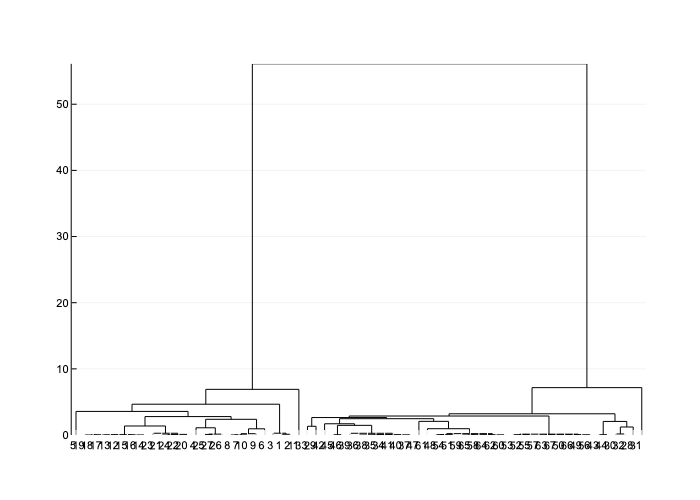

In [985]:
plot(hc_early, xrotation=1)

In [973]:
mdf = biobank.obs[idxs, [:donor, :species]];

In [975]:
t = newick(hc_early);

In [986]:
n = NewickTree.parent(NewickTree.getleaves(t)[2]);

In [987]:
lnames = parse.(Int, NewickTreeTools.getleafnames(n))

3-element Vector{Int64}:
 19
 18
 17

In [990]:
all(mdf[lnames, :].donor[1] .== mdf[lnames, :].donor[2:end]) & 
all(mdf[lnames, :].species[1] .== mdf[lnames, :].species[2:end])

true

In [1009]:
t = newick(hc_early)
as_polytomy!(t, fun=n->begin
    lnames = parse.(Int, NewickTreeTools.getleafnames(n))
    all(mdf[lnames, :].donor[1] .== mdf[lnames, :].donor[2:end]) & 
    all(mdf[lnames, :].species[1] .== mdf[lnames, :].species[2:end])
end)
hc_early_filteredheights = mapinternalnodes(t) do n
    1 - (NewickTree.getdistance(t, n) / last(hc_early.heights))
end

t = newick(hc_middle)
as_polytomy!(t, fun=n->begin
    lnames = parse.(Int, NewickTreeTools.getleafnames(n))
    all(mdf[lnames, :].donor[1] .== mdf[lnames, :].donor[2:end]) & 
    all(mdf[lnames, :].species[1] .== mdf[lnames, :].species[2:end])
end)
hc_middle_filteredheights = mapinternalnodes(t) do n
    1 - (NewickTree.getdistance(t, n) / last(hc_middle.heights))
end

t = newick(hc_late)
as_polytomy!(t, fun=n->begin
    lnames = parse.(Int, NewickTreeTools.getleafnames(n))
    all(mdf[lnames, :].donor[1] .== mdf[lnames, :].donor[2:end]) & 
    all(mdf[lnames, :].species[1] .== mdf[lnames, :].species[2:end])
end)
hc_late_filteredheights = mapinternalnodes(t) do n
    1 - (NewickTree.getdistance(t, n) / last(hc_late.heights))
end

25-element Vector{Any}:
 1.0
 0.32551561749100544
 0.3006765805827064
 0.12674966829479384
 0.292385932947958
 0.28236085042650283
 0.17070893452949443
 0.1528037194746218
 0.38860361427644596
 0.27509110930160563
 ⋮
 0.23943353626580566
 0.2301003611564939
 0.21503050327070428
 0.20166435295106788
 0.13517133508047563
 0.11589209801419942
 0.07481001379160701
 0.04226401547187042
 0.003773025689543519

In [1013]:
pltheight_vecs = [
    hc_early_filteredheights[2:end],
    hc_middle_filteredheights[2:end],
    hc_late_filteredheights[2:end],
];

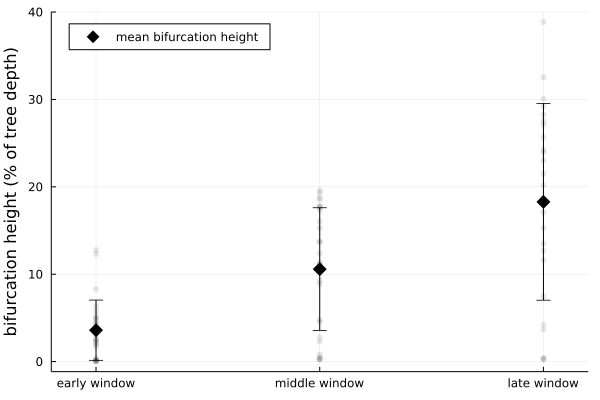

In [1046]:
gr()
plot(
    ylabel="bifurcation height (% of tree depth)",
    xticks=(1:3, ["early window", "middle window", "late window"]),
    xlims=(.8, 3.2),
    legend=:topleft,
)
# violin!(pltheight_vecs .* 100, label="", c=:lightgrey, jitterwidth=.2)
dotplot!(pltheight_vecs .* 100, label="", alpha=.1, c=:black, mode=:none)
scatter!(mean.(pltheight_vecs) .* 100, yerror=std.(pltheight_vecs.*100),
    label="mean bifurcation height", c=:black, marker=:diamond, markersize=7)

In [1047]:
savefig(joinpath(pdir, "hclust_bifurcationheights_gnavus&uniformis.pdf"))

## Variance across CSB in early, middle, late windows

In [835]:
oggisincsb = mapslices(x->sum(x)>0., bbmtx, dims=1)[:];

In [836]:
Mprime_early = BBuhat[:, 1:10] * diagm(UPusv.S[1:10]) * UPusv.Vt[1:10, oggisincsb];
Mprime_middle = BBuhat[:, 11:90] * diagm(UPusv.S[11:90]) * UPusv.Vt[11:90, oggisincsb];
Mprime_late = BBuhat[:, 91:end] * diagm(UPusv.S[91:end]) * UPusv.Vt[91:end, oggisincsb];

In [931]:
varMprime_early = vec(mapslices(var, Mprime_early, dims=1))
varMprime_middle = vec(mapslices(var, Mprime_middle, dims=1))
varMprime_late = vec(mapslices(var, Mprime_late, dims=1))

topN = 30

top_varMprime_early_oggs = partialsortperm(varMprime_early, 1:topN; rev=true);
top_varMprime_middle_oggs = partialsortperm(varMprime_middle, 1:topN; rev=true);
top_varMprime_late_oggs = partialsortperm(varMprime_late, 1:topN; rev=true);
# each list is unique
uniqueOGGlist = vcat(top_varMprime_early_oggs, top_varMprime_middle_oggs, top_varMprime_late_oggs);


In [932]:
varmatrix = hcat([
    varMprime_early[uniqueOGGlist],
    varMprime_middle[uniqueOGGlist],
    varMprime_late[uniqueOGGlist],

]...);
oggnamescsb = uniprot.var_names[oggisincsb][uniqueOGGlist];

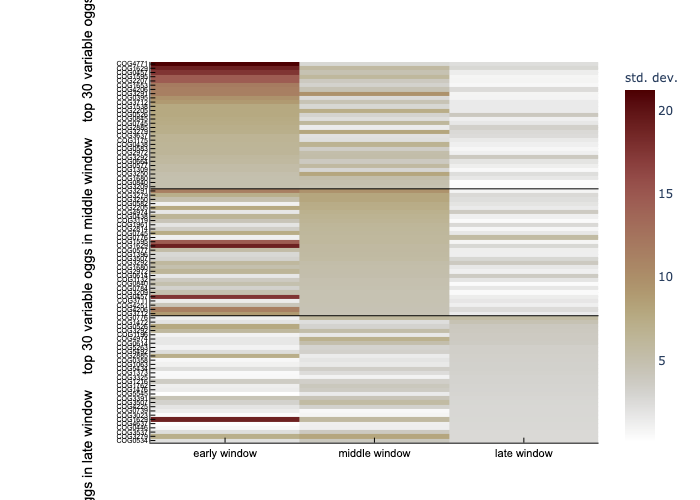

In [952]:
plotlyjs()
plot(
    size=(400, 800),
    yticks=(1:size(varmatrix,1), oggnamescsb),
    ytickfontsize=5,
    ylabel="top 30 variable oggs in late window    top 30 variable oggs in middle window    top 30 variable oggs in early window",
    ylabelfontsize=10,
    xticks=(1:3, ["early window", "middle window", "late window"]),
    yflip=true,
    leftmargin=5Plots.Measures.mm,
    colorbartitle="std. dev."
)
heatmap!(sqrt.(varmatrix), c=:bilbao)
hline!([topN + .5, 2topN + .5], c=:black, label="")

In [959]:
varMprime_early = vec(mapslices(var, Mprime_early, dims=1))
varMprime_middle = vec(mapslices(var, Mprime_middle, dims=1))
varMprime_late = vec(mapslices(var, Mprime_late, dims=1))

topN = 210

top_varMprime_early_oggs = partialsortperm(varMprime_early, 1:topN; rev=true);
top_varMprime_middle_oggs = partialsortperm(varMprime_middle, 1:topN; rev=true);
top_varMprime_late_oggs = partialsortperm(varMprime_late, 1:topN; rev=true);

tvogg_early = setdiff(top_varMprime_early_oggs, union(top_varMprime_middle_oggs, top_varMprime_late_oggs))
tvogg_middle = setdiff(top_varMprime_middle_oggs, union(top_varMprime_early_oggs, top_varMprime_late_oggs))
tvogg_late = setdiff(top_varMprime_late_oggs, union(top_varMprime_middle_oggs, top_varMprime_middle_oggs))
@show length(tvogg_early), length(tvogg_middle), length(tvogg_late)
# each list is unique
uniqueOGGlist = vcat(tvogg_early[1:30], tvogg_middle[1:30], tvogg_late[1:30]);


(length(tvogg_early), length(tvogg_middle), length(tvogg_late)) = (55, 33, 98)


In [963]:
varmatrix = hcat([
    varMprime_early[uniqueOGGlist],
    varMprime_middle[uniqueOGGlist],
    varMprime_late[uniqueOGGlist],

]...);
oggnamescsb = uniprot.var_names[oggisincsb][uniqueOGGlist];

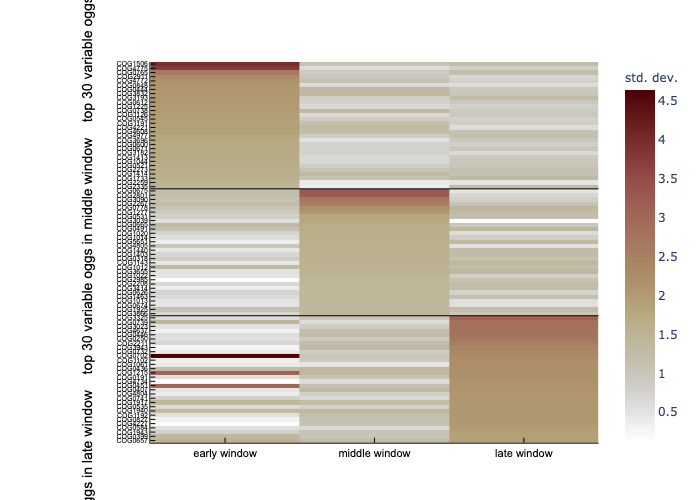

In [1048]:
plotlyjs()
plot(
    size=(400, 800),
    yticks=(1:size(varmatrix,1), oggnamescsb),
    ytickfontsize=5,
    ylabel="top 30 variable oggs in late window    top 30 variable oggs in middle window    top 30 variable oggs in early window",
    ylabelfontsize=10,
    xticks=(1:3, ["early window", "middle window", "late window"]),
    yflip=true,
    leftmargin=5Plots.Measures.mm,
    colorbartitle="std. dev."
)
heatmap!(sqrt.(varmatrix), c=:bilbao)
hline!([30 + .5, 2*30 + .5], c=:black, label="")

In [1049]:
savefig(joinpath(pdir, "stddev-variance_heatmap_allCSB.pdf"))

## Write out unique late window OGGs

In [ ]:
var_Mprime_early_br_all = findall(mapslices(var, Mprime_early_br, dims=1)[:].>1.);
var_Mprime_middle_br_all = findall(mapslices(var, Mprime_middle_br, dims=1)[:].>1.);
var_Mprime_late_br_all = findall(mapslices(var, Mprime_late_br, dims=1)[:].>1.);

In [ ]:
rdir = projectdir("_research", "latewindow_GSEA") |> mkpath

"/Users/ben/projects/Doran_etal_2022/_research/latewindow_GSEA"

In [ ]:
uniprot.var[oggisinbr, :][setdiff(var_Mprime_late_br_all, var_Mprime_middle_br_all, var_Mprime_early_br_all), :] |>
    df -> CSV.write(joinpath(rdir, "uniquevariable_latewindow_oggs.tsv"), df, delim="\t")

"/Users/ben/projects/Doran_etal_2022/_research/latewindow_GSEA/uniquevariable_latewindow_oggs.tsv"

## Make umap

In [43]:
donorid = biobank.obs_names |>
    x->split.(x, "_") |>
    x->first.(x) |>
    x->split.(x, ".") |>
    x->first.(x, 2) |>
    x->join.(x, "_");

In [44]:
r_idxs = occursin.("gnavus", biobank.obs.species) |> findall
popat!(r_idxs, occursin.("MSK.8.22", biobank.obs_names[r_idxs]) |> findfirst) # outlier
b_idxs = occursin.("uniformis", biobank.obs.species) |> findall;
# popat!(b_vulgatus_idxs, occursin.("MSK.7.24", biobank.obs_names[b_vulgatus_idxs]) |> findfirst) # contaminant
# donorid = biobank.obs_names |>
#     v -> split.(v, ".") |>
#     v -> getindex.(v, 2) |>
#     v -> parse.(Int,v)

b_idxs = b_idxs[sortperm(donorid[b_idxs])]
r_idxs = r_idxs[sortperm(donorid[r_idxs])]

idxs = union(b_idxs,  r_idxs);

In [15]:
oggisinbr = sum(bbmtx[idxs,:]; dims=1)[:] .> 0.;
orig_cnt_mtx = bbmtx[idxs, oggisinbr];
@show size(orig_cnt_mtx);

size(orig_cnt_mtx) = (67, 2583)


In [16]:
round(sqrt(67), digits=1)

8.2

In [17]:
dist = Cityblock()
nn = 66
nepoch = 300;

In [20]:
coords = matread(joinpath(ddir, "umapcoords_gnavus-uniformis_dist=cityblock_nepoch=300_nn=66.mat"))
oggembedding = coords["originalcount_coords"]
spe_oggembedding = coords["specieswindow_coords"]
pc1to10_oggembedding = coords["bbPCs1to10_coords"]
don_oggembedding = coords["donorwindow_coords"];

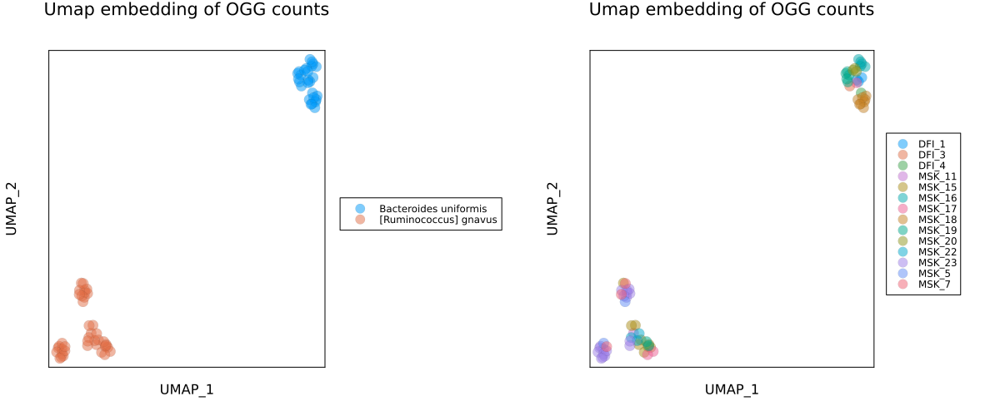

In [55]:
# oggembedding = umap(orig_cnt_mtx', 2; metric=dist, n_neighbors=nn, n_epochs=nepoch);

# Paint by species
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p1 = scatter!(oggembedding[1, :], oggembedding[2,:], 
    group=biobank.obs.species[idxs],
    size=(800,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,
    )
# paint by donor
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p2 = scatter!(oggembedding[1, :], oggembedding[2,:], 
    group=donorid[idxs],
    size=(700,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,)

lt = @layout [a{.55w} b]
    plot(p1, p2; size=(1200, 500), layout=lt, link=:y, margin=10Plots.Measures.mm)

In [54]:
savefig(joinpath(pdir, "umap_gnavus-uniformis_originalcounts.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/uniformis_gnavus_umaps_and_extra/umap_gnavus-uniformis_originalcounts.pdf"

In [34]:
spimtx = calc_spi_mtx(BBuhat[idxs,:], UPusv.S, getintervals(UPusv.S)) ./ 10177;

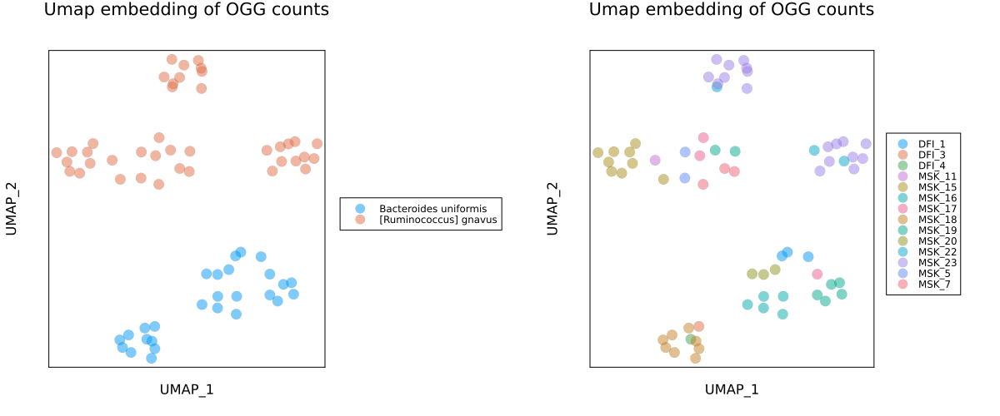

In [51]:
# spectral_oggembedding = umap(BBuhat[idxs, :]', 2; metric=dist, n_neighbors=nn, n_epochs=nepoch);

# Paint by species
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p1 = scatter!(spectral_oggembedding[1, :], spectral_oggembedding[2,:], 
    group=biobank.obs.species[idxs],
    size=(800,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,
    )
# paint by donor
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p2 = scatter!(spectral_oggembedding[1, :], spectral_oggembedding[2,:], 
    group=donorid[idxs],
    size=(700,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,)

lt = @layout [a{.55w} b]
plot(p1, p2; size=(1200, 500), layout=lt, link=:y, margin=10Plots.Measures.mm)

In [52]:
savefig(joinpath(pdir, "umap_gnavus-uniformis_spectral_allcomps.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/uniformis_gnavus_umaps_and_extra/umap_gnavus-uniformis_spectral_allcomps.pdf"

In [671]:
# speBBuhat = BBuhat[idxs, 1:90] * diagm(UPusv.S[1:90]);
speBBuhat = BBuhat[idxs, 1:90] * diagm(UPusv.S[1:90]) * UPusv.Vt[1:90, :];

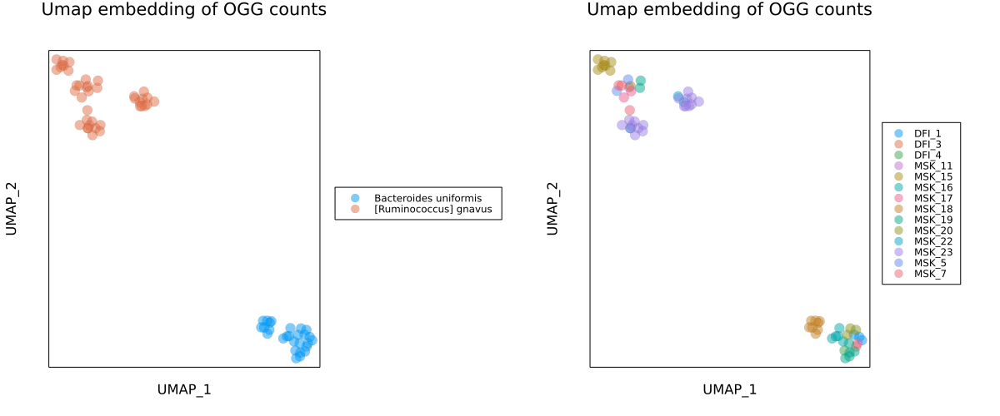

In [673]:
# spe_oggembedding = umap(speBBuhat', 2; metric=dist, n_neighbors=nn, n_epochs=nepoch);

# Paint by species
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p1 = scatter!(spe_oggembedding[1, :], spe_oggembedding[2,:], 
    group=biobank.obs.species[idxs],
    size=(800,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,
    )
# paint by donor
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p2 = scatter!(spe_oggembedding[1, :], spe_oggembedding[2,:], 
    group=donorid[idxs],
    size=(700,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,)

lt = @layout [a{.55w} b]
plot(p1, p2; size=(1200, 500), layout=lt, link=:y, margin=10Plots.Measures.mm)

In [674]:
savefig(joinpath(pdir, "umap_gnavus-uniformis_specieswindow.pdf"))

In [683]:
# # speBBuhat = BBuhat[idxs, 1:90] * diagm(UPusv.S[1:90]);
# fullbbmtx = biobank["oggs"].X[:, :]
# ispresent = mapslices(x->sum(x)>0., fullbbmtx, dims=1)[:]
# BBusv = svd(fullbbmtx[:, ispresent])
# speBBpcs1to10 = BBusv.U[idxs, 1:10];

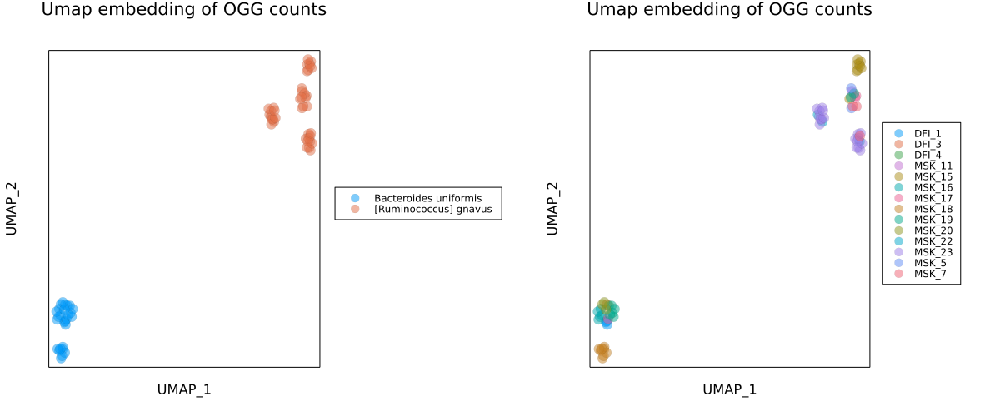

In [699]:
# pc1to10_oggembedding = umap(speBBpcs1to10', 2; metric=dist, n_neighbors=nn, n_epochs=nepoch);

# Paint by species
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p1 = scatter!(pc1to10_oggembedding[1, :], pc1to10_oggembedding[2,:], 
    group=biobank.obs.species[idxs],
    size=(800,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,
    )
# paint by donor
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p2 = scatter!(pc1to10_oggembedding[1, :], pc1to10_oggembedding[2,:], 
    group=donorid[idxs],
    size=(700,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,)

lt = @layout [a{.55w} b]
plot(p1, p2; size=(1200, 500), layout=lt, link=:y, margin=10Plots.Measures.mm)

In [700]:
savefig(joinpath(pdir, "umap_gnavus-uniformis_pcs1to10-inbiobank.pdf"))

In [675]:
donBBuhat = BBuhat[idxs, 91:end] * diagm(UPusv.S[91:end]);
# donBBuhat = BBuhat[idxs, 91:end] * diagm(UPusv.S[91:end]) * UPusv.Vt[91:end, :];

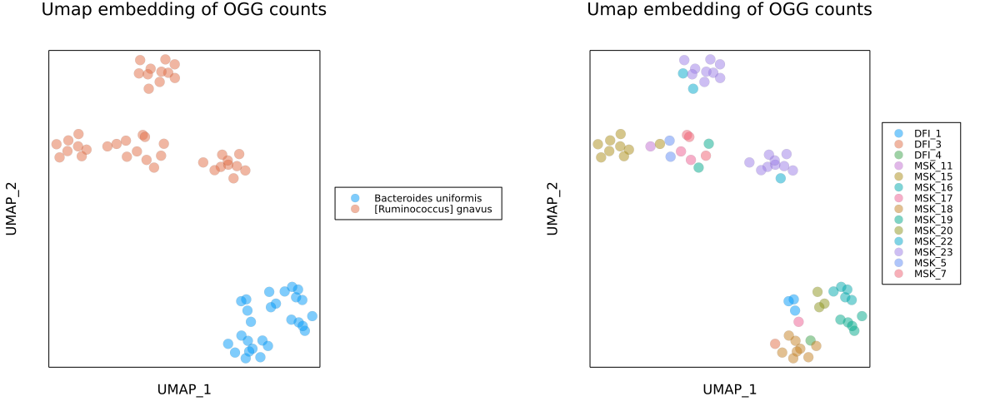

In [676]:
# don_oggembedding = umap(donBBuhat', 2; metric=dist, n_neighbors=nn, n_epochs=nepoch);

# Paint by species
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p1 = scatter!(.-don_oggembedding[1, :], don_oggembedding[2,:], 
    group=biobank.obs.species[idxs],
    size=(800,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,
    )
# paint by donor
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p2 = scatter!(.-don_oggembedding[1, :], don_oggembedding[2,:], 
    group=donorid[idxs],
    size=(700,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,)

lt = @layout [a{.55w} b]
plot(p1, p2; size=(1200, 500), layout=lt, link=:y, margin=10Plots.Measures.mm)

In [677]:
savefig(joinpath(pdir, "umap_gnavus-uniformis_donorwindow.pdf"))

In [19]:
ddir = datadir("exp_pro", "BB673", "gnavus_uniformis_suppdata") |> mkpath

"/Users/ben/projects/Doran_etal_2022/data/exp_pro/BB673/gnavus_uniformis_suppdata"

In [48]:
matwrite(joinpath(ddir, "umapcoords_gnavus-uniformis_dist=cityblock_nepoch=300_nn=66.mat"),
    Dict(
        "originalcount_coords" => oggembedding,
        "specieswindow_coords" => spe_oggembedding,
        "donorwindow_coords" => don_oggembedding,
        "bbPCs1to10_coords" => pc1to10_oggembedding,
        "spectral_coords" => spectral_oggembedding,
    ))

In [ ]:
# spiogg_donorwindow = calc_spi_mtx(UPusv.V, UPusv.S, partitions[91:end]);
# spiogg_donorwindow_embedding = umap(spiogg_donorwindow, 2; metric=:precomputed, n_epochs=300);
# matwrite(datadir("exp_pro", "UP7047", "spiogg_donorwindow.mat"), Dict("spimtx"=>spiogg_donorwindow))
# matwrite(datadir("exp_pro", "UP7047", "spiogg_donorwindow_embedding.mat"), Dict("embedding"=>spiogg_donorwindow_embedding))

In [ ]:
partitions = getintervals(UPusv.S);

In [ ]:
spe_spi_distmtx = calc_spi_mtx(BBuhat[idxs, :], UPusv.S, partitions[1:89]);

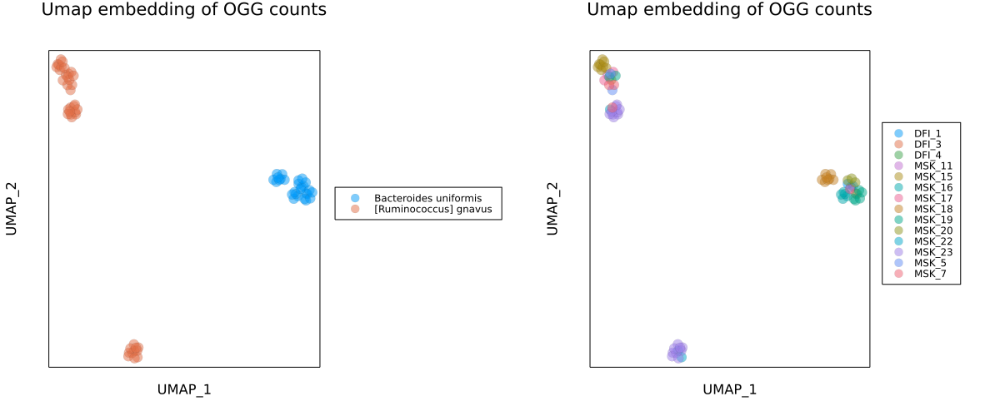

In [ ]:
oggembedding = umap(spe_spi_distmtx, 2; metric=:precomputed, n_neighbors=nn, n_epochs=nepoch);

# Paint by species
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p1 = scatter!(oggembedding[1, :], oggembedding[2,:], 
    group=biobank.obs.species[idxs],
    size=(800,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,
    )
# paint by donor
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p2 = scatter!(oggembedding[1, :], oggembedding[2,:], 
    group=donorid[idxs],
    size=(700,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,)

lt = @layout [a{.55w} b]
    plot(p1, p2; size=(1200, 500), layout=lt, link=:y, margin=10Plots.Measures.mm)

In [ ]:
don_spi_distmtx = calc_spi_mtx(BBuhat[idxs, :], UPusv.S, partitions[90:end]) ./ 10177;

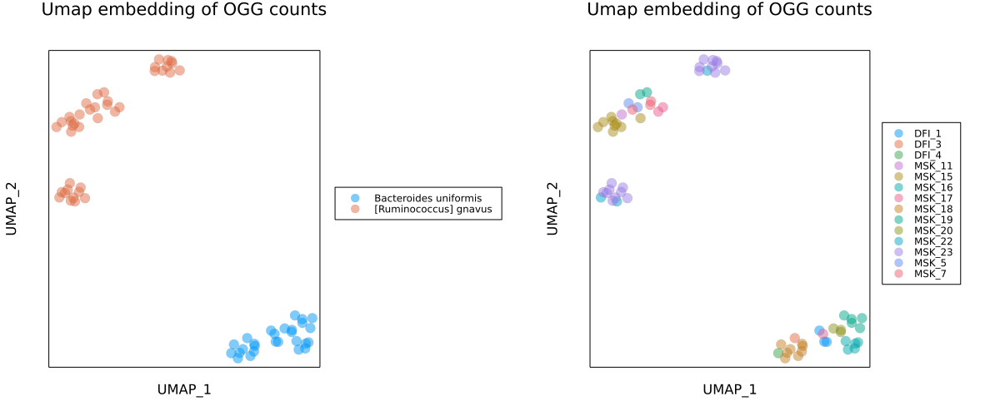

In [ ]:
oggembedding = umap(don_spi_distmtx, 2; metric=:precomputed, n_neighbors=nn, n_epochs=nepoch);

# Paint by species
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p1 = scatter!(.-oggembedding[1, :], oggembedding[2,:], 
    group=biobank.obs.species[idxs],
    size=(800,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,
    )
# paint by donor
plot(
    title="Umap embedding of OGG counts",
    legend=:outerright,
    framestyle=:box,
    tickdirection=:none,
    grid=:none,
    ticks=:none,
    xlabel="UMAP_1",
    ylabel="UMAP_2",
    margin=5Plots.Measures.mm,)
p2 = scatter!(.-oggembedding[1, :], oggembedding[2,:], 
    group=donorid[idxs],
    size=(700,600),
    markersize=7,
    markerstrokewidth=0.1,
    alpha=.5,)

lt = @layout [a{.55w} b]
plot(p1, p2; size=(1200, 500), layout=lt, link=:y, margin=10Plots.Measures.mm)